<center><h1> Sliced Optimal Transport and Application to Color Transfer</h1></center>

### Minh Hai NGUYEN, Cam Thanh Ha LE, Tess AZEVEDO, Amandine CAPITAINE, 5GMM, INSA Toulouse


References:

1. [Computational Optimal Transport, Gabriel Peyré and Marco Cuturi](https://optimaltransport.github.io/book/)

2. [Adaptive Color Transfer With Relaxed Optimal Transport, Julien Rabin et al](https://hal.archives-ouvertes.fr/hal-01002830/document)

3. [Guided Image Filtering, K. He et al](https://ieeexplore.ieee.org/document/6319316)


The goal of this practical session is to study the Sliced Optimal Transport method that approximates the computation of Optimal Transport (OT) between two distributions. We demonstrate its application through a Color Transfer problem. 

### Introduction to Optimal Transport

Given two  probability measures $\mu \in X$ and $\nu\in Y$, and a *cost function* $c(\cdot,\cdot): X\times Y \rightarrow \mathbb{R}^+$, in OT, we seek an **optimal transport** plan $T: X\rightarrow Y$ which minimizes the following quantity

$${\displaystyle \inf \left\{\left.\int _{X}c(x,T(x))\,\mathrm {d} \mu (x)\;\right|\;T_{*}(\mu )=\nu \right\}.}$$

where for any measurable set $A \subset Y$, $T_{*}$ is defined as 
$$T_{*}(\mu)(A) = \mu(T^{-1}(A))$$

In other words, the solution $T$ *transports* the distribution $\mu$ to the distribution $\nu$ with the minimal distance (w.r.t the cost function $c$). 

The cost function of the optimal transport defines a metric between Radon measure. We can define the  $p^{th}$ [Wasserstein metric](https://en.wikipedia.org/wiki/Wasserstein_metric), $\mathcal{W}_p(\mu,\nu)$ as
$$\displaystyle \mathcal{W}_{p}(\mu ,\nu ):={\left(\displaystyle \inf \left\{\left.\int _{X}c(x,T(x))^p\,\mathrm {d} \mu (x)\;\right|\;T_{*}(\mu )=\nu \right\}\right)^{1/p}}$$

An analogy with piles of sand is usually used to explain the definition: let us consider that $\mu$ is a pile of sand and $\nu$ a hole (with the same *volume* or *mass*), if we consider that the cost of moving an elementary volume of sand from on point to the other is proportional to the Euclidean distance ($l_2$ cost function), then the optimal transport plan gives you the most efficient way to move all the sand from $\mu$ to $\nu$. Again, the literature is huge and there are many alternative definitions, please refer to [Computational Optimal Transport](https://optimaltransport.github.io/book/) for a more complete introduction to the subject.


### Wasserstein Distance and its Approximations - Application to Color Transfer

From now, we only consider discrete density distribution in $\mathbb{R}^d$ that are represented as point clouds $X = \left\{ X_i \right\}_{i \in I} \subset \mathbb{R}^d$ 

The link between OT and color transfer follows the observation that color histograms are discrete Radon measures. In fact, **an image is not a distribution**, so we need to represent an image as a distribution. A natural way is to represent an image as **a point cloud discretization**, let $f \in \mathbb{R}^{N \times d}$ be an image of $N$ pixels and $d$ colors ($d = 3$ for RGB images, $d=1$ for gray-scale images), each pixel can be seen as a point in $\mathbb{R}^d$, let $X = \left\{ X_i \right\}_{i = 0,1,...,N-1}$ (for example $(X_i = R_i, G_i, B_i)$ if $d=3$) be the set of all pixels, its corresponding point cloud distribution is 
$$\mu_X = \frac{1}{N}\sum_{i = 0}^{N-1} \delta_{X_i}$$
where $\delta_{X_i}$ is the dirac distribution as location $X_i$.

The **quadratic Wasserstein distance** $W(\mu_X, \mu_Y)$ between two point clouds $X, Y$ of the same size $N$ is defined as
\begin{equation}
W(\mu_X, \mu_Y)^2 = \min_{\sigma} W_\sigma(\mu_X, \mu_Y) \hspace*{1cm} \text{where} \hspace*{1cm} W_\sigma(\mu_X, \mu_Y) = \sum_{i = 0}^{N-1} \lVert X_i - Y_{\sigma(i)} \rVert^2
\end{equation}

where $\sigma$ is a permutation of $N$ elements which defines a mapping between the two point clouds. For simplicity, in the following, $W(\mu_X, \mu_Y)$ will be denoted as $W(X,Y)$.

Consider an input image $u$ with its corresponding point cloud $X$ and a target image $v$ with its corresponding point cloud $Y$ (of the same size),  the **Color Transfer** problem between $u$ and $v$ can be solved by matching the distribution $\mu_X$ to $\mu_Y$, or by finding the optimal assignment $i \mapsto \sigma^*(i)$ which minimizes the quadratic Wasserstein distance.



### Importing packages

Below is a list of packages needed and a brief explanation of its use in this notebook:

- `numpy` (library used for working with arrays)
- `matplotlib` (library used for working with images)
-  `os` (library used for interact with the operating system)
- `Axes3D` (library used for display 3D graphics)
- `pot`(python optimal transport library) 


In [1]:
import numpy as np
from scipy import signal
import os

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image
import seaborn as sns
import time


Setting parameter for displaying purpose. Comment the latex usage if you don't have latex installed on your system.

In [2]:
plt.style.use('seaborn')
plt.rcParams['text.usetex'] = True
plt.rc("axes", labelsize = 14)
plt.rc("axes", titlesize = 16)
%matplotlib inline

The below function `RGB_cloud` loading an image as a point cloud and the function `display_cloud` allows us to display the image
as a point cloud in 3D space.

In [3]:
def RGB_cloud(img, sampling, shape = (256,256)):
    """
    Calculate the RGB cloud
    Args:
        imgs : narray or path to an image
        sampling : sampling rate
    Return:
        RGB cloud, of shape (N, 3) where N is the number of pixels
    """
    if isinstance(img, str):
        A = load_image(img, shape)
    else:
        A = img.copy()
    A = A[::sampling, ::sampling, :]

    return A.reshape((-1,3))

def load_image(fname, shape = (256, 256)):
    img = Image.open(fname).convert("RGB").resize((shape[1], shape[0]))  # RGB
    return np.array(img) / 255.0  # Normalized to [0,1]
    
def display_cloud(ax, x):
    x_ = x
    ax.scatter(x_[:, 0], x_[:, 1], x_[:, 2], s=25 * 500 / len(x_), c=x_)

def display_image(ax, x, shape = None):
    if shape == None:
        W = int(np.sqrt(len(x)))
        x_ = x.reshape((W, W, 3))
    else:
        x_ = x.reshape((shape[0], shape[1], -1))
    ax.imshow(x_)



### Optimal Transport in 1D

In one dimension, the assignment $\sigma$ which minimizes the previous cost is the one which preserves the ordering of the points. More precisely, if $\sigma_X$ and $\sigma_Y$ are the permutations such that 
$$X_{\sigma_X(1)} \leq X_{\sigma_X(2)} \leq \dots \leq X_{\sigma_X(N)},$$
$$Y_{\sigma_Y(1)} \leq Y_{\sigma_Y(2)} \leq \dots \leq Y_{\sigma_Y(N)},$$
then the optimal permutation $\sigma^*$ that minimizes $(1)$ is
$$ \sigma^* =  \sigma_Y \circ \sigma_X^{-1}$$
and so that the points $X_{\sigma_X(i)}$ is assigned to the point $Y_{\sigma_Y(i)}$. The Wasserstein distance together with the optimal assignment can thus be computed in $O(N \log(N))$ operations using a fast sorting algorithm. 

The following function `transport1D` takes two 1D point clouds $X$ and $Y$ and return the permutations $\sigma_X$ and $\sigma_Y$. 


In [4]:
def transport1D(X, Y):
    sx = np.argsort(X)  
    sy = np.argsort(Y)
    return sx, sy

###  Sliced Optimal Transport in 3D

Finding the solution of the assignment problem using Wasserstein Distance $W$ in more than one dimension is computationally too demanding for the application to image processing since $N$ can be quite large. Moreover, $W$ is more difficult to compute in problems requiring the optimization of point clouds. For these reasons, we now consider an alternative metric, named **Sliced Wasserstein Distance** and defined by
\begin{equation}
    SW(X,Y)^2 = \int_{\theta \in \Omega} W(X_\theta, Y_\theta)^2 d\theta  \hspace{1cm} \text{where}  \hspace{1cm}
    X_\theta = \left\{ \langle X_i, \theta \rangle \right\}_{i = 0,...,N-1}, Y_\theta = \left\{ \langle Y_i, \theta \rangle \right\}_{i = 0,...,N-1}
\end{equation}
and where $\Omega = \left\{\theta \in \R^d : \lVert \theta \rVert = 1 \right\}$ is the unit sphere. 

The Sliced Wasserstein Distance is obtained by aggregating 1D Wasserstein Distance of projected point clouds.

In our case where $X$ and $Y$ are of the same size $N$, the Sliced Wasserstein Distance can be re-written as 
$$SW(X,Y)^2 = \int_{\Omega} \left( \sum_{i=0}^{N-1} |\langle X_{\sigma_{X, \theta}(i)} - Y_{\sigma_{Y, \theta}(i)} \rangle |^2 \right)d\theta$$
where $\sigma_{X, \theta}, \sigma_{Y, \theta}$ are the permutations ordering in increasing order of $X_\theta, Y_\theta$ (i.e. 1D Transport), respectively.

Again, computing the optimal assignment $\sigma^*$ in this case is still untractable. Therefore, instead of computing the explicit solution, we make use of a stochastic gradient descent algorithm which computes the solution of a sliced approximation of the optimal transport problem over 1D distributions (see the following [paper](http://hal.archives-ouvertes.fr/hal-00476064/fr/) for more details). 




Remark that we want to match the point cloud $X$ to $Y$, therefore if we fix $Y$, the function $E_Y(X) \overset{\text{def.}}{=}  SW(X,Y)$ is smooth and its gradient (w.r.t $X$) is a vector where the $i-$ th component is
$$\nabla E_Y(X)_i = 2 \int_{\Omega} \left( \langle X_i - Y_{\sigma_{Y,\theta} \circ \sigma_{X, \theta}^{-1}(i)}, \theta \rangle \theta \right) d\theta $$

Using a small enough step size $\tau$, the stochastic gradient descent iteration is written as
$$X \leftarrow X - \tau \nabla E_Y(X)$$

This gradient can be calculated by replacing the integral by a finite sum against randomly drawn directions $\theta \in \Omega$. But numerically, instead of calculating the approximated gradient by a Monte Carlo estimation, we can decompose the gradient at each iteration with a randomly direction $\theta$ by updating
$$X \leftarrow X - \tau \left( \langle X - Y_{\sigma_{Y,\theta} \circ \sigma_{X, \theta}^{-1}}, \theta \rangle \theta \right)$$


At convergence, $X$ has the same distribution as $Y$.

In resume, an algorithm for transferring color between the input image $X$ and the target image $Y$ can be deduced as following:
+  Require: step size $\tau$, number of iterations $n$
+  Initialize $Z = X$
+  For $k$ in $0, 1, ..., n - 1$:
    +  Draw randomly a direction $\theta \in \Omega$
    +  Update :
        $$Z = Z - \tau \left( \langle Z - Y_{\sigma_{Y,\theta} \circ \sigma_{Z, \theta}^{-1}}, \theta \rangle \theta \right)$$


where  $\sigma_{Y, \theta}$ and $\sigma_{Z, \theta}$ are the permutations that order the one-dimensional projected point clouds $\{(Y_j,u_i)\}_{j=1\dots n}$ and $\{(Z_j,u_i)\}_{j=1\dots n}$ on $\theta$. This permutation at each iteration can be computed thanks to the function `transport1D` defined above.   

We can visualize this stochastic gradient descent in a matching two 1D distributions. Let's first create two point sets in 1D

<Figure size 800x550 with 0 Axes>

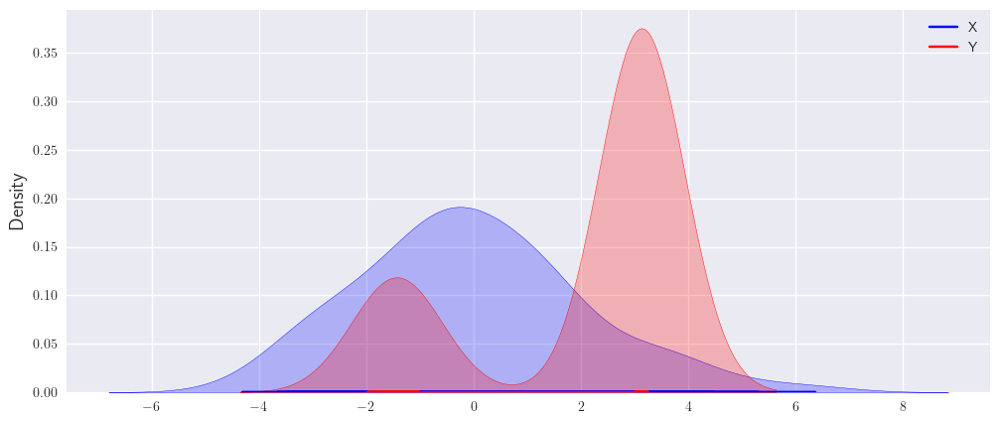

In [5]:
n = 100
X = 2 * np.random.normal(0, 1, n)
Y = np.concatenate((
        np.random.rand(n//4) - 2,
        .25*np.random.rand(n - n//4) + 3))

plt.clf()
plt.figure(figsize=(12, 5))
plt.plot(X, np.zeros(n),'b',label='X')
sns.kdeplot(X, color = 'b', fill = True)
plt.plot(Y, np.zeros(n),'r',label='Y')
sns.kdeplot(Y, color = 'r', fill = True)
plt.legend()
plt.show()

We want to transport the red point cloud to the blue point cloud using OT. The following code illustrates how the OP moves the blue points to reach to distribution of the red points.

First we need to update the blue points by stochastic gradient descent and store them for illustrative purpose.

In [6]:
# Loop over a maximum number of iterations, let's say 100
X_arr = [X]
Z = np.copy(X)  # starting point
sx, sy = transport1D(X, Y)
n_iter = 100
for k in range(n_iter):
    Z[sx] = X[sx] + (k / n_iter) * (Y[sy] - X[sx])
    X_arr.append(Z)

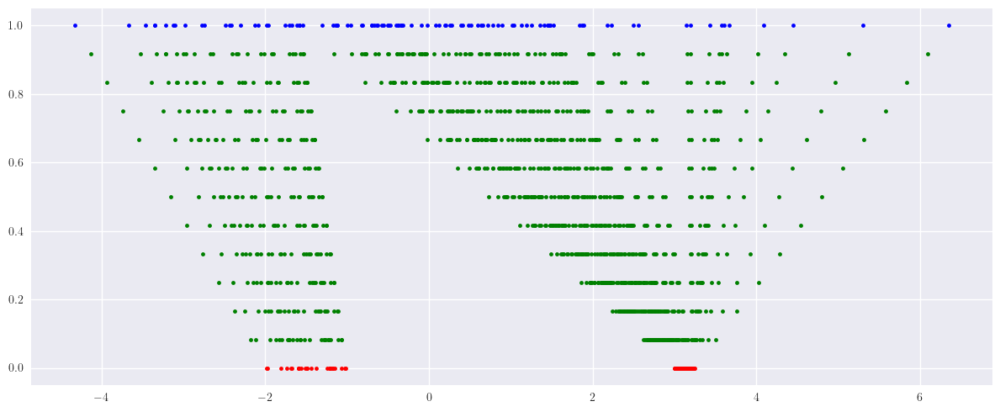

In [7]:
sx, sy = transport1D(X,Y)
Z = np.zeros(n)
k = 0

fig = plt.figure(figsize=(12, 5))
plt.plot(X, np.ones(n),'.b')
plt.plot(Y, np.zeros(n),'.r')
n_steps = 12
for k in range(1, n_steps):
    Z[sx] = X[sx] + (k/n_steps) * (Y[sy]-X[sx])
    plt.plot(Z,((n_steps-k)/n_steps)*np.ones(n),'.g')
fig.tight_layout()

In [8]:
def transport3D(X, Y, niter = 5000, lr = 0.1): #X, Y, Z are nx3 matrices
    """
    Sliced Wasserstein OT in 3D
    Input: X - input point cloud, array of shape (N, 3)
           Y - target point cloud, array of shape (N, 3)
           niter - number of iterations
           lr - step

    """
    Z = np.copy(X) # output
    for k in range(niter):
        # drawn a random direction
        u = np.random.randn(3)
        u = u / np.linalg.norm(u)

        Y_theta = np.dot(Y, u) # N, 1
        Z_theta = np.dot(Z, u) # N, 1
        
        # permutation
        sigma_Z, sigma_Y = transport1D(Z_theta, Y_theta)    # N

        # update
        Z[sigma_Z,:] += lr * (Y_theta[sigma_Y] - Z_theta[sigma_Z])[:,None] * u

        
    return Z, sigma_Z, sigma_Y

## Numerical Illustrations

### 3D Optimal Transport between two simple point clouds

Let create two point clouds on 3D space with different distributions

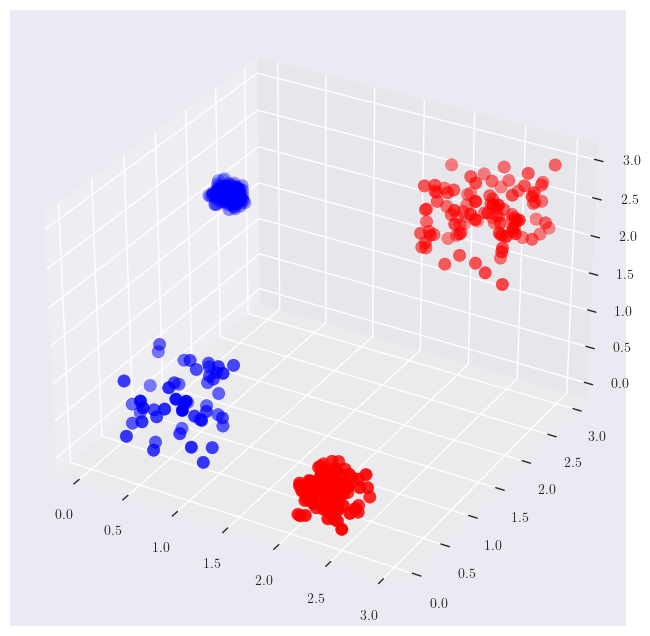

In [9]:
X = np.vstack((
        np.random.rand(50,3),
        .25 * np.random.rand(150,3) + np.array([[0,2,2]])
        ))
Y = np.vstack((
        np.random.rand(100,3) + np.array([[2,2,2]]),
        .5 * np.random.rand(100,3) + np.array([[2,0,0]])
        ))
fig = plt.figure(figsize=(8, 8)) 
axis = fig.add_subplot(1, 1, 1, projection="3d")
axis.scatter(X[:,0],X[:,1],X[:,2],c='blue',s=80)
axis.scatter(Y[:,0],Y[:,1],Y[:,2],c='red',s=80)
plt.show()

We want to **transport** the blue points to the red points using the function `transport3D`.
Let visualize the results after $3000$ iterations.

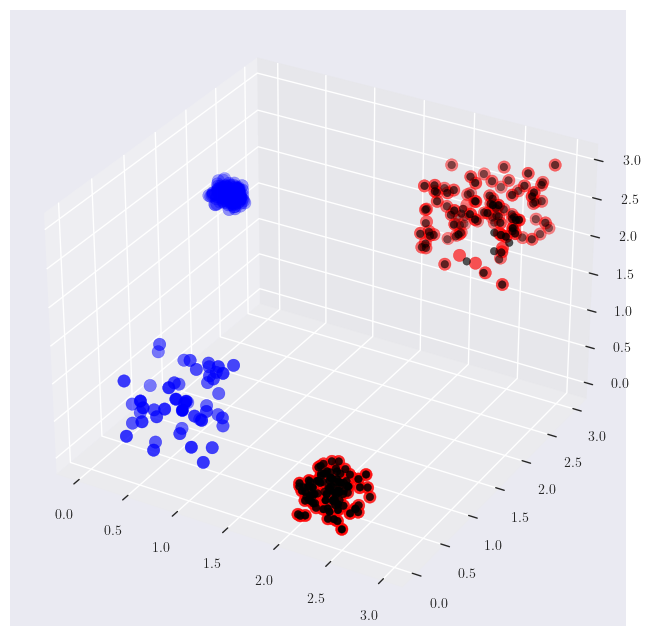

In [10]:
Z, sZ, sY = transport3D(X, Y, 3000, 0.1)

fig = plt.figure(figsize=(8, 8)) 
ax = fig.add_subplot(1, 1, 1, projection="3d")
ax.scatter(X[:,0],X[:,1],X[:,2],c='blue',s=80)
ax.scatter(Y[:,0],Y[:,1],Y[:,2],c='red',s=80)
ax.scatter(Z[:,0],Z[:,1],Z[:,2],c='black',s=30)

We notice that the final points (in black) are approximately in the same position as the red points. We can visualize the displacement of the blue points toward to the red points.

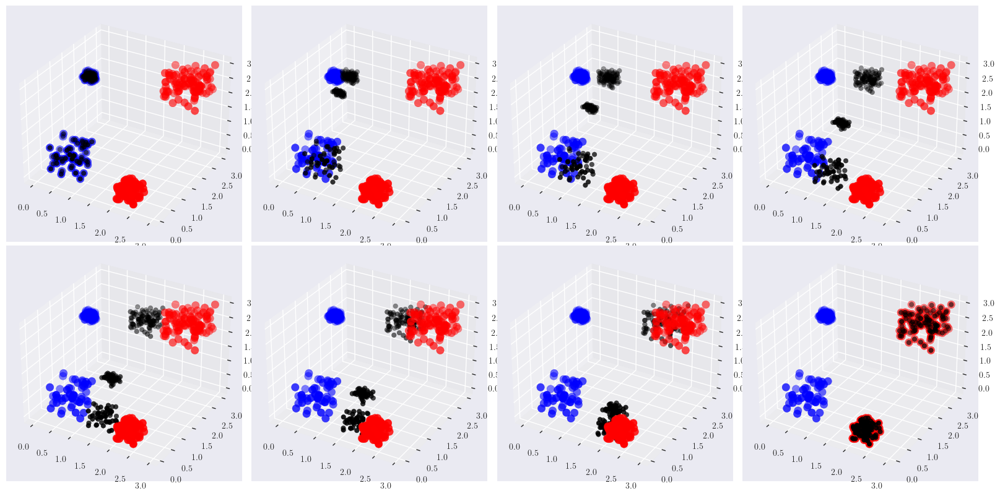

In [11]:
# correction
Z, sZ, sY = transport3D(X,Y,3000,0.1)

fig = plt.figure(figsize=(16, 8)) 
Z = np.zeros(X.shape)
k = 0
for i in range(4):
    for j in range(2):
        Z[sZ,:] = X[sZ,:] + (k/7) * (Y[sY,:] - X[sZ,:])
        ax = fig.add_subplot(2, 4, k+1, projection="3d")
        ax.scatter(X[:,0],X[:,1],X[:,2],c='blue',s=80)
        ax.scatter(Y[:,0],Y[:,1],Y[:,2],c='red',s=80)
        ax.scatter(Z[:,0],Z[:,1],Z[:,2],c='black',s=30)
        k += 1
fig.tight_layout()

### Application to Color Transfer

Reading images as point clouds 

In [12]:
sampling = 1
shape = (256, 256)
X = RGB_cloud("./data/guy.jpg", sampling, shape)
Y = RGB_cloud("./data/cat.jpg", sampling, shape)

# X = RGB_cloud("./data/download.png", sampling, shape)
# Y = RGB_cloud("./data/venise.jpg", sampling, shape)

# X = RGB_cloud("./data/tree.jpg", sampling, shape)
# Y = RGB_cloud("./data/mountain.jpg", sampling, shape)

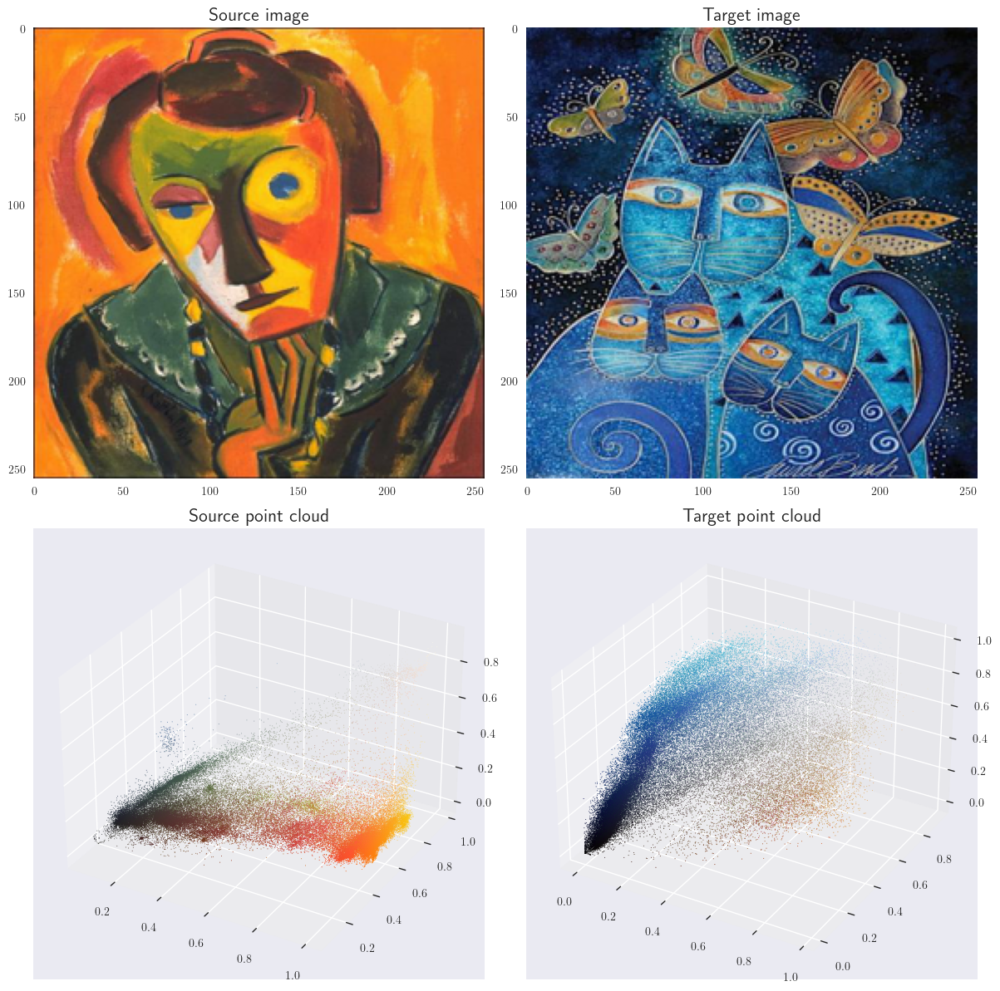

In [13]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(2, 2, 1)
display_image(ax, X, shape)
ax.set_title("Source image")
ax.grid(False)
ax = fig.add_subplot(2, 2, 2)
display_image(ax, Y, shape)
ax.set_title("Target image")
ax.grid(False)

ax = fig.add_subplot(2, 2, 3, projection="3d")
display_cloud(ax, X)
ax.set_title("Source point cloud")
ax = fig.add_subplot(2, 2, 4, projection="3d")
display_cloud(ax, Y)
ax.set_title("Target point cloud")
plt.grid("off")
plt.tight_layout()
# plt.savefig("./animations/tree.png")

Transfer the color of the target image to the input image by Sliced Wasserstein Distance. We minimize the Sliced Wasserstein Distance by Stochastic Gradient Descent 

In [14]:
tic = time.time() 
Z, _, _ = transport3D(X, Y, niter = 10000, lr = 0.1) 
tac = time.time()
print(tac - tic)

142.0389108657837


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


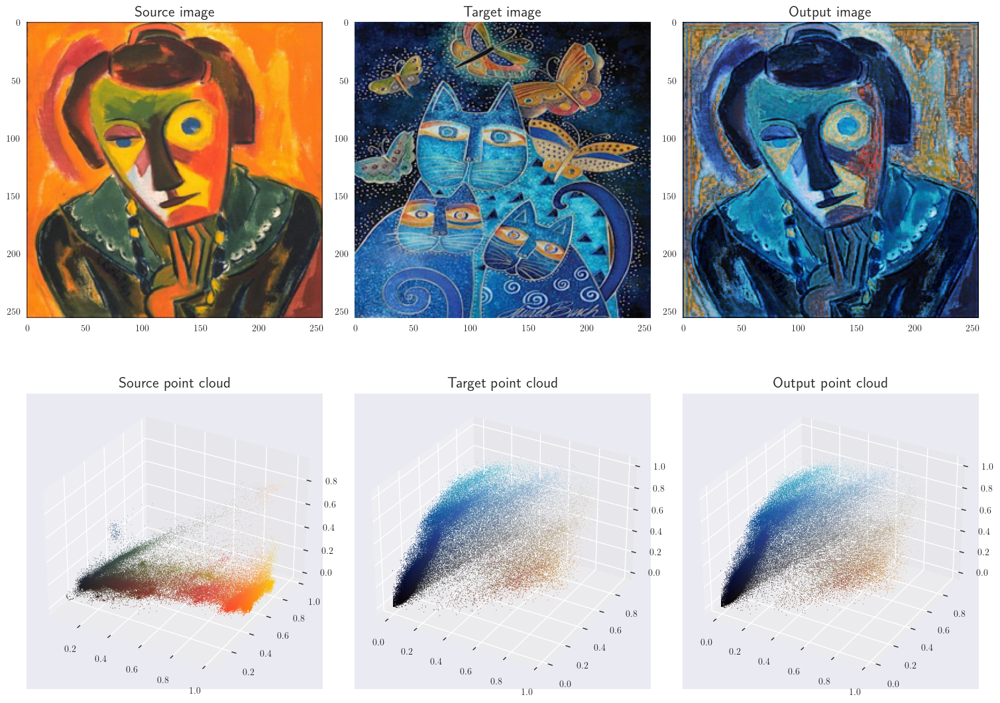

In [15]:
fig = plt.figure(figsize=(15, 25))
ax = fig.add_subplot(1, 3, 1)
display_image(ax, X, shape)
ax.set_title("Source image")
ax.grid(False)
ax = fig.add_subplot(1, 3, 2)
display_image(ax, Y, shape)
ax.set_title("Target image")
ax.grid(False)
ax = fig.add_subplot(1, 3, 3)
display_image(ax, Z, shape)
ax.set_title("Output image")
ax.grid(False)

ax = fig.add_subplot(2, 3, 4, projection="3d")
display_cloud(ax, X)
ax.set_title("Source point cloud")
ax = fig.add_subplot(2, 3, 5, projection="3d")
display_cloud(ax, Y)
ax.set_title("Target point cloud")
ax = fig.add_subplot(2, 3, 6, projection="3d")
display_cloud(ax, Z.clip(0,1))
ax.set_title("Output point cloud")
plt.tight_layout()

# plt.savefig("./animations/tree_output.png")

## Postprocessing - Regularization



A common drawback of this color transfer using the Sliced Wasserstein Distance is the revealing of artifacts, such as color blending, attenuation of details and textures.



Let denote $u$ the input image and $T(u)$ the image after color transfer, in this section we apply a generic filtering method enabling to suppress artifacts while preserving the details (see [this paper](https://hal.archives-ouvertes.fr/hal-03690435/document) for more details).  

The idea comes from the simple fact that we can rewrite $T(u)$ as 
$$T(u) = u + T(u) - u$$

The principle is to apply a filtering modification to *the difference map*, denoted by $M(u) = T(u) - u$. Therefore, to reduce the artifacts observed in $T(u)$, we can filter $M(u)$ by a filter (or operator) $H$ and then the final image can be obtained by
$$u + H(M(u)) = u + H(T(u) - u) $$

We can play with different filters $H_u$.

### A simple average filter

We start with the most simple filter - the average filter. In this case, it becomes a convolution with a constant filter : 
$$H : v \mapsto h \star v$$
where $h$ is a small filter of size $m \times m$, fulfilled by $\frac{1}{m^2}$. Note that to avoid the border effects, we can use `reflect padding` instead of `zeros_padding`. To compute this convolution, we can use the built-in `convolve2d` of the `scipy.signal` library.
  

In [16]:
from scipy.signal import convolve2d

In [17]:
def gaussian_filter(n, s):
    x = np.arange(-n/2,n/2,1)
    [Y,X] = np.meshgrid(x,x)
    h = np.exp((-X**2-Y**2)/(2*s**2))
    h = h/np.sum(h)
    return h

def avg_filtering(input, kernel_size = 3):
    """
    Average filtering: filter the image by a convolution with an average kernel
    Args: input [narray], input image, of shape (H, W, 3)
          kernel_size (int) 
    """
    kernel = np.ones((kernel_size, kernel_size))
    H, W, C = input.shape
    output = np.zeros_like(input)
    for c in range(C):
        output[...,c] = convolve2d(input[...,c], kernel, mode = "same", boundary="symm")
    return output / kernel_size**2


/tmp/ipykernel_20628/2212221135.py:6: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axes[0].grid(b=None)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_20628/2212221135.py:10: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axes[1].grid(b=None)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_20628/2212221135.py:14: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axes[2].grid(b=None)


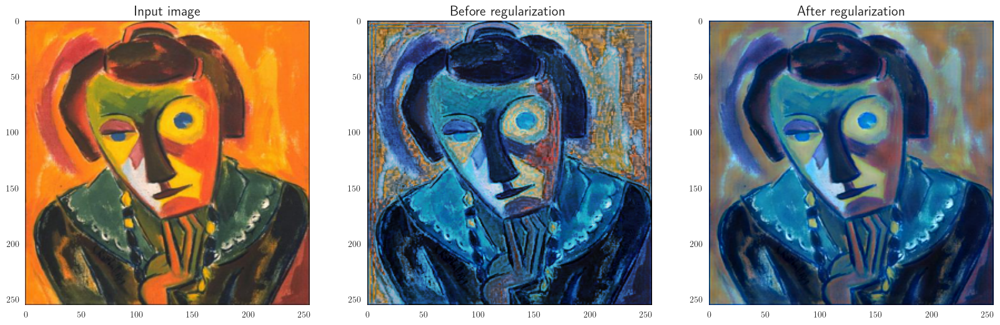

In [18]:
Z_avg = X.reshape((shape[0],shape[1],3)) + avg_filtering((Z - X).reshape((shape[0],shape[1],3)), kernel_size=10)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))
axes[0].imshow(X.reshape((shape[0],shape[1],3)))
axes[0].set_title('Input image')
axes[0].grid(b=None)

axes[1].imshow(Z.reshape((shape[0],shape[1],3)))
axes[1].set_title('Before regularization')
axes[1].grid(b=None)

axes[2].set_title('After regularization')
axes[2].imshow(Z_avg)
axes[2].grid(b=None)


### Guided fitering

We first define a general linear translation-variant filtering
process, which involves a guidance image $I$, an filtering
input image $p$, and an output image $q$. Both $I$ and $p$ are
given beforehand according to the application, and they can
be identical.

The filtering output at a pixel i is expressed as a weighted average: $$q_i = \sum_{j} W_{ij}(I)p_j $$

where $i$ and $j$ are pixel indexes. The filter kernel $W_{ij}$ is a
function of the guidance image $I$ and independent of the input image $p$. This
filter is linear with respect to $p$.

The key assumption of the
guided filter is a local linear model between the guidance $I$
and the filtering output $q$. We assume that $q$ is a linear
transform of $I$ in a window $\omega_k$ centered at the pixel $k$:
$$q_i = a_kI_i + b_k, \forall i \in \omega_k$$
where $(a_k, b_k)$ are some linear coefficients assumed to be constant in $\omega_k$. We use a square window of a radius $r$. This local linear model ensures that $q$ has an edge only if $I$ has an edge because $\nabla q = a \nabla I$.

To determine $a_k$ and $b_k$, we seek to minimize the difference between $q$ and $p$ while maintaining to linear relation. Specifically, we minimize the following function in the window $\omega_k$ 
$$E(a_k, b_k) = \sum_{i \in \omega_k} ((a_k I_i + b_k - p_i)^2 + \epsilon a_k^2)$$
where $\epsilon$ is a regularization parameter penalizing large $a_k$. 

The solution is given by 
$$a_k = \frac{\frac{1}{|\omega|} \sum_{i \in \omega_k} I_i p_i - \mu_k \overline{p}_k  }{\sigma_k ^ 2 + \epsilon}$$
and 
$$b_k =  \overline{p}_k  - a_k \mu_k$$

where $\mu_k$ and $\sigma_k$ are the mean and variance of $I$ in $\omega_k$, $|\omega|$ is the number of pixels in $\omega_k$ and $ \overline{p}_k $ is the mean of $p$ in $\omega_k$.

A pseudocode of the guided filtering is given by the following.

**ALGORITHM:** (Source: [Guided Image Filtering, K. He et al](https://ieeexplore.ieee.org/document/6319316))

**Input:** Filtering input image $p$, guidance image $I$, radius $r$ matching the kernel size of the filter, regularization parameter $\epsilon$ (prevent dividing by zero)

**Ouput:** Filtering output $q$

**Note:** $f_{\texttt{mean}}$ is a mean filter, $\odot$ denote the element-wise product and $\oslash$ denote the element-wise division. 


-  $\texttt{mean}_I = f_{\texttt{mean}}(I)$
- $\texttt{mean}_p = f_{\texttt{mean}}(p)$
- $\texttt{corr}_I = f_{\texttt{mean}}(I \odot I)$
-   $\texttt{corr}_{Ip} = f_{\texttt{mean}}(I\odot p)$

- $\texttt{var}_I = \texttt{corr}_I - \texttt{mean}_I \odot \texttt{mean}_I$
-   $\texttt{cov}_{Ip} = \texttt{corr}_{Ip} - \texttt{mean}_I\odot \texttt{mean}_p$

- $a = \texttt{cov}_{Ip} \oslash  (\texttt{var}_I+\epsilon)$
-   $b = \texttt{mean}_p - a \odot\texttt{mean}_I$

- $\texttt{mean}_a = f_{\texttt{mean}}(a)$
-   $\texttt{mean}_b = f_{\texttt{mean}}(b)$

**Return** $q = \texttt{mean}_a \odot I + \texttt{mean}_b$


This algorith has several advantages such as :
- Preserving the edges 
- Structure- transferring thanks to the local linear model 

In [19]:
def guided_filtering(u, guide, r, eps):
    C           = avg_filtering(np.ones(u.shape), r)   # to avoid image edges pb

    mean_u      = avg_filtering(u, r)/C
    mean_guide  = avg_filtering(guide, r)/C
    corr_guide  = avg_filtering(guide*guide, r)/C
    corr_uguide = avg_filtering(u*guide, r)/C
    var_guide   = corr_guide - mean_guide * mean_guide
    cov_uguide  = corr_uguide - mean_u * mean_guide

    alpha = cov_uguide / (var_guide + eps)
    beta = mean_u - alpha * mean_guide

    mean_alpha = avg_filtering(alpha, r)/C
    mean_beta = avg_filtering(beta, r)/C

    q = mean_alpha * guide + mean_beta
    return q

/tmp/ipykernel_20628/1809637907.py:6: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axes[0].grid(b=None)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_20628/1809637907.py:10: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axes[1].grid(b=None)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_20628/1809637907.py:14: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axes[2].grid(b=None)


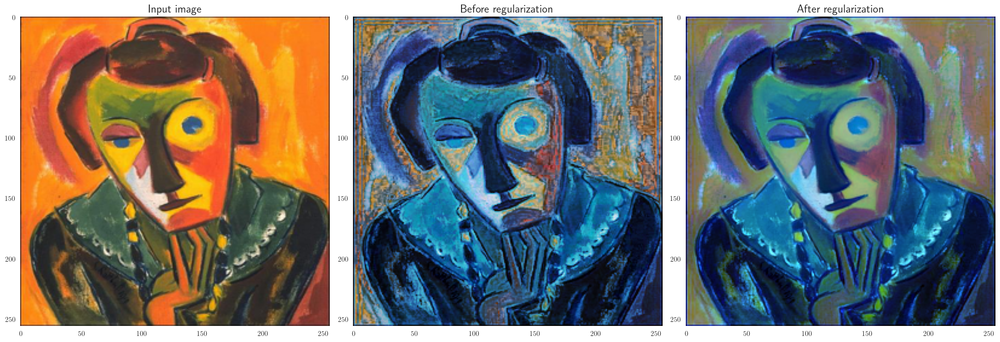

In [20]:
Z_guided = X.reshape((shape[0],shape[1],3)) + guided_filtering((Z - X).reshape((shape[0],shape[1],3)),X.reshape((shape[0],shape[1],3)), r=20,eps=1e-4)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))
axes[0].imshow(X.reshape((shape[0],shape[1],3)))
axes[0].set_title('Input image')
axes[0].grid(b=None)

axes[1].imshow(Z.reshape((shape[0],shape[1],3)))
axes[1].set_title('Before regularization')
axes[1].grid(b=None)

axes[2].set_title('After regularization')
axes[2].imshow(Z_guided)
axes[2].grid(b=None)

plt.tight_layout()
# plt.savefig("slicedw_guided_2.png")

### Comparison


/tmp/ipykernel_20628/1538167657.py:4: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axes[0, 0].grid(b=None)
/tmp/ipykernel_20628/1538167657.py:8: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axes[0, 1].grid(b=None)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_20628/1538167657.py:12: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axes[1, 0].grid(b=None)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_20628/1538167657.py:16: MatplotlibDeprecationWarni

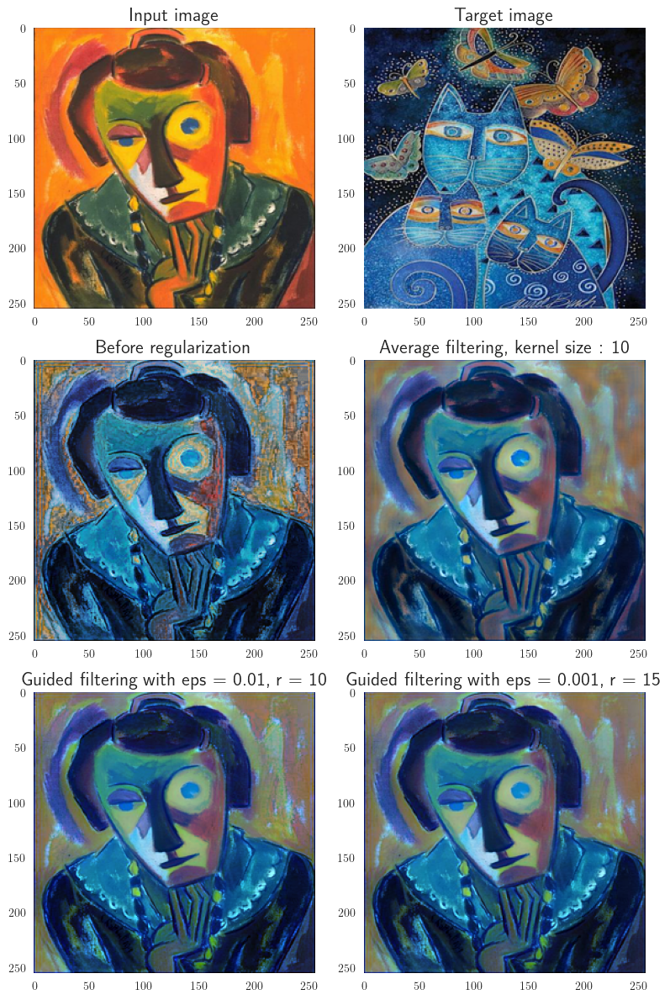

In [21]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(8, 12))
axes[0, 0].imshow(X.reshape((shape[0],shape[1],3)))
axes[0, 0].set_title('Input image')
axes[0, 0].grid(b=None)

axes[0, 1].imshow(Y.reshape((shape[0],shape[1],3)))
axes[0, 1].set_title('Target image')
axes[0, 1].grid(b=None)

axes[1, 0].imshow(Z.reshape((shape[0],shape[1],3)))
axes[1, 0].set_title('Before regularization')
axes[1, 0].grid(b=None)

axes[1, 1].imshow(Z_avg.reshape((shape[0],shape[1],3)))
axes[1, 1].set_title('Average filtering, kernel size : 10')
axes[1, 1].grid(b=None)

eps1 = 0.01
r1 = 10
Z_guided_1 = X.reshape((shape[0],shape[1],3)) + guided_filtering((Z - X).reshape((shape[0],shape[1],3)),X.reshape((shape[0],shape[1],3)), r=r1,eps=eps1)

axes[2, 0].set_title(f'Guided filtering with eps = {eps1}, r = {r1}')
axes[2, 0].imshow(Z_guided.reshape((shape[0],shape[1],3)))
axes[2, 0].grid(b=None)

eps2 = 0.001
r2 = 15
Z_guided_2 = X.reshape((shape[0],shape[1],3)) + guided_filtering((Z - X).reshape((shape[0],shape[1],3)),X.reshape((shape[0],shape[1],3)), r=r2,eps=eps2)
axes[2, 1].set_title(f'Guided filtering with eps = {eps2}, r = {r2}')
axes[2, 1].imshow(Z_guided_2.reshape((shape[0],shape[1],3)))
axes[2, 1].grid(b=None)

plt.tight_layout()
# plt.savefig("./animations/tree_compare.png")

**Note:** $\epsilon$ is a regularization parameter preventing $a_k$ being too large

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_20628/1938266400.py:11: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axes[i].grid(b=None)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integ

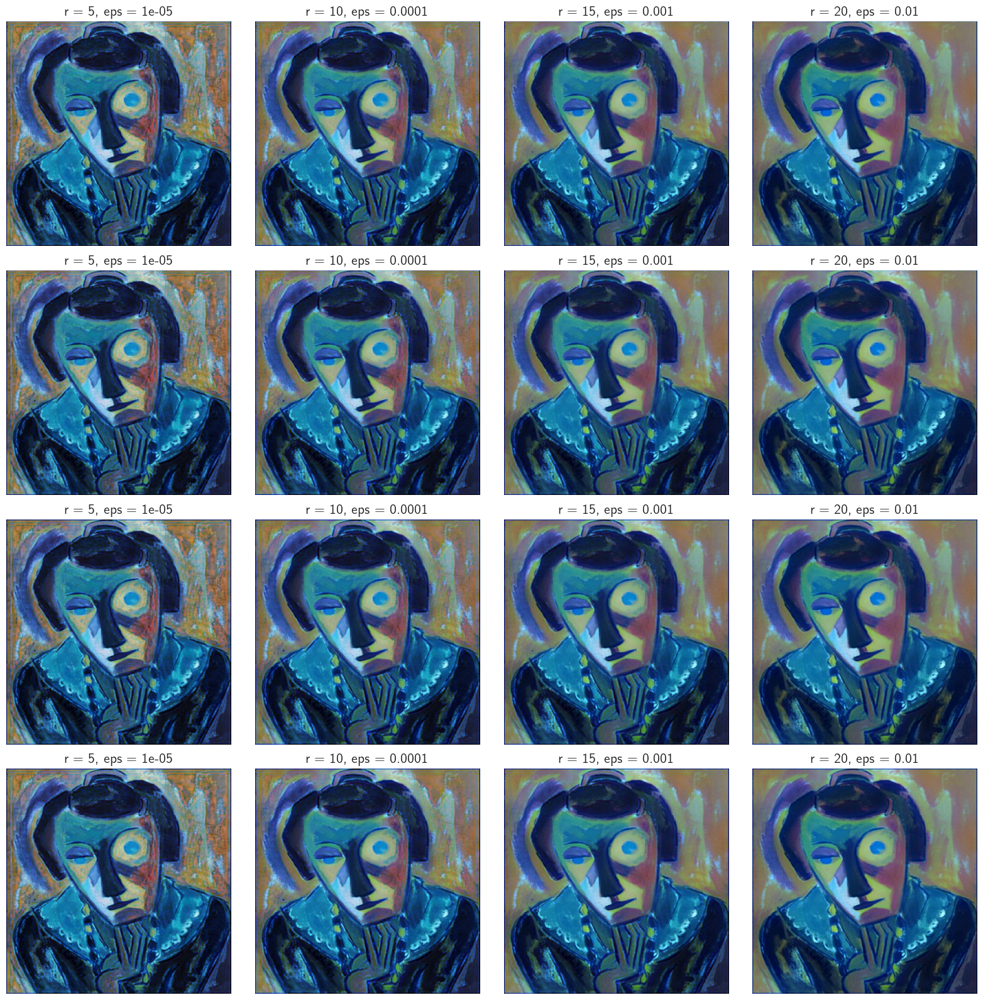

In [22]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(16, 16))
axes = axes.ravel()
r_arr = [5, 10, 15, 20]
eps_arr = [1e-5, 1e-4, 1e-3, 1e-2]
for i in range(16):
    guided = X.reshape((shape[0],shape[1],3)) + guided_filtering((Z - X).reshape((shape[0],shape[1],3)),X.reshape((shape[0],shape[1],3)), r=r_arr[i%4],eps=eps_arr[i%4])
    axes[i].imshow(guided.reshape((shape[0],shape[1],3)))
    axes[i].set_title(f"r = {r_arr[i%4]}, eps = {eps_arr[i%4]}")
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    axes[i].grid(b=None)

plt.tight_layout()
plt.show()